In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
import sqlite3
from glob import glob

%matplotlib inline

In [2]:
csv_files = glob("./zippedData/*.csv.gz")
csv_files

['./zippedData/imdb.title.crew.csv.gz',
 './zippedData/tmdb.movies.csv.gz',
 './zippedData/imdb.title.akas.csv.gz',
 './zippedData/imdb.title.ratings.csv.gz',
 './zippedData/imdb.name.basics.csv.gz',
 './zippedData/imdb.title.basics.csv.gz',
 './zippedData/tn.movie_budgets.csv.gz',
 './zippedData/bom.movie_gross.csv.gz',
 './zippedData/imdb.title.principals.csv.gz']

In [3]:
csv_files_dict = {}
for filename in csv_files:
    filename_cleaned = os.path.basename(filename).replace(".csv.gz", "").replace(".", "_") # cleaning the filenames
    filename_df = pd.read_csv(filename, index_col=0)
    csv_files_dict[filename_cleaned] = filename_df

In [4]:
csv_files_dict.keys()

dict_keys(['imdb_title_crew', 'tmdb_movies', 'imdb_title_akas', 'imdb_title_ratings', 'imdb_name_basics', 'imdb_title_basics', 'tn_movie_budgets', 'bom_movie_gross', 'imdb_title_principals'])

In [5]:
movie_budgets_df = csv_files_dict['tn_movie_budgets']
movie_budgets_df.head(50)

,release_date,movie,production_budget,domestic_gross,worldwide_gross
id,,,,,
1,"Dec 18, 2009",Avatar,"$425,000,000","$760,507,625","$2,776,345,279"
2,"May 20, 2011",Pirates of the Caribbean: On Stranger Tides,"$410,600,000","$241,063,875","$1,045,663,875"
3,"Jun 7, 2019",Dark Phoenix,"$350,000,000","$42,762,350","$149,762,350"
4,"May 1, 2015",Avengers: Age of Ultron,"$330,600,000","$459,005,868","$1,403,013,963"
5,"Dec 15, 2017",Star Wars Ep. VIII: The Last Jedi,"$317,000,000","$620,181,382","$1,316,721,747"
6,"Dec 18, 2015",Star Wars Ep. VII: The Force Awakens,"$306,000,000","$936,662,225","$2,053,311,220"
7,"Apr 27, 2018",Avengers: Infinity War,"$300,000,000","$678,815,482","$2,048,134,200"
8,"May 24, 2007",Pirates of the Caribbean: At Worldâs End,"$300,000,000","$309,420,425","$963,420,425"
9,"Nov 17, 2017",Justice League,"$300,000,000","$229,024,295","$655,945,209"


### **I must adjust values for inflation**

In [6]:
movie_budgets_df.describe()

,release_date,movie,production_budget,domestic_gross,worldwide_gross
count,5782,5782,5782,5782,5782
unique,2418,5698,509,5164,5356
top,"Dec 31, 2014",Home,"$20,000,000",$0,$0
freq,24,3,231,548,367


In [7]:
movie_budgets_df.shape

(5782, 5)

In [8]:
movie_budgets_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5782 entries, 1 to 82
Data columns (total 5 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   release_date       5782 non-null   object
 1   movie              5782 non-null   object
 2   production_budget  5782 non-null   object
 3   domestic_gross     5782 non-null   object
 4   worldwide_gross    5782 non-null   object
dtypes: object(5)
memory usage: 271.0+ KB


In [9]:
def convert_amt_to_int(df, col):
    df[col] = df[col].str.replace("$", "").str.replace(",", "").astype('int')
    return df

In [10]:
money_cols = ['production_budget', 'domestic_gross', 'worldwide_gross']

for col in money_cols:
    movie_budgets_df = convert_amt_to_int(movie_budgets_df, col)

In [11]:
movie_budgets_df.isna().sum()

release_date         0
movie                0
production_budget    0
domestic_gross       0
worldwide_gross      0
dtype: int64

In [12]:
for col in movie_budgets_df:
    print(col)
    print(movie_budgets_df[col].value_counts(normalize=True)[:])
    print('===================================')

release_date
Dec 31, 2014    0.004151
Dec 31, 2015    0.003978
Dec 31, 2010    0.002594
Dec 31, 2008    0.002421
Dec 31, 2012    0.002248
                  ...   
Nov 19, 1975    0.000173
Nov 23, 2012    0.000173
Apr 2, 1993     0.000173
Aug 10, 1990    0.000173
Jan 18, 1967    0.000173
Name: release_date, Length: 2418, dtype: float64
movie
Home                           0.000519
King Kong                      0.000519
Halloween                      0.000519
The Ten Commandments           0.000346
The Island                     0.000346
                                 ...   
The Pink Panther               0.000173
The Masked Saint               0.000173
The Man with the Iron Fists    0.000173
When the Game Stands Tall      0.000173
The Lords of Salem             0.000173
Name: movie, Length: 5698, dtype: float64
production_budget
20000000    0.039952
10000000    0.036666
30000000    0.030612
15000000    0.029920
25000000    0.029575
              ...   
16400000    0.000173
103000    

In [13]:
movie_budgets_df['budget_gross_diff'] = (movie_budgets_df['worldwide_gross'] + movie_budgets_df['domestic_gross']) - \
                                        movie_budgets_df['production_budget']
movie_budgets_df.head()


,release_date,movie,production_budget,domestic_gross,worldwide_gross,budget_gross_diff
id,,,,,,
1,"Dec 18, 2009",Avatar,425000000,760507625,2776345279,3111852904
2,"May 20, 2011",Pirates of the Caribbean: On Stranger Tides,410600000,241063875,1045663875,876127750
3,"Jun 7, 2019",Dark Phoenix,350000000,42762350,149762350,-157475300
4,"May 1, 2015",Avengers: Age of Ultron,330600000,459005868,1403013963,1531419831
5,"Dec 15, 2017",Star Wars Ep. VIII: The Last Jedi,317000000,620181382,1316721747,1619903129


In [14]:
movie_budgets_df.shape

(5782, 6)

In [15]:
movie_budgets_df = movie_budgets_df.sort_values(by = 'budget_gross_diff', ascending=False)

In [16]:
movie_budgets_df.head(10)

,release_date,movie,production_budget,domestic_gross,worldwide_gross,budget_gross_diff
id,,,,,,
1,"Dec 18, 2009",Avatar,425000000,760507625,2776345279,3111852904
6,"Dec 18, 2015",Star Wars Ep. VII: The Force Awakens,306000000,936662225,2053311220,2683973445
43,"Dec 19, 1997",Titanic,200000000,659363944,2208208395,2667572339
7,"Apr 27, 2018",Avengers: Infinity War,300000000,678815482,2048134200,2426949682
34,"Jun 12, 2015",Jurassic World,215000000,652270625,1648854864,2086125489
27,"May 4, 2012",The Avengers,225000000,623279547,1517935897,1916215444
42,"Feb 16, 2018",Black Panther,200000000,700059566,1348258224,1848317790
67,"Apr 3, 2015",Furious 7,190000000,353007020,1518722794,1681729814
44,"Jun 15, 2018",Incredibles 2,200000000,608581744,1242520711,1651102455


In [17]:
#movie_budgets_df_top50 = movie_budgets_df[:50]

<AxesSubplot:xlabel='budget_gross_diff', ylabel='movie'>

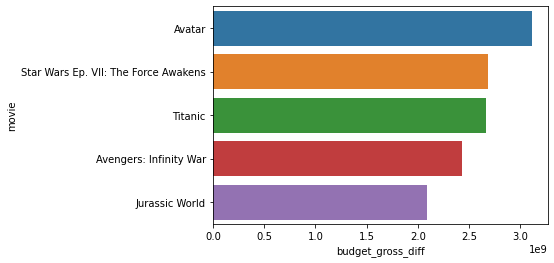

In [18]:
sns.barplot(x ='budget_gross_diff', y ='movie', data = movie_budgets_df[:5])

## Exploring ROI

In [19]:
movie_budgets_df['ROI'] = movie_budgets_df['budget_gross_diff'] / movie_budgets_df['production_budget']
movie_budgets_df.head()

,release_date,movie,production_budget,domestic_gross,worldwide_gross,budget_gross_diff,ROI
id,,,,,,,
1,"Dec 18, 2009",Avatar,425000000,760507625,2776345279,3111852904,7.322007
6,"Dec 18, 2015",Star Wars Ep. VII: The Force Awakens,306000000,936662225,2053311220,2683973445,8.771155
43,"Dec 19, 1997",Titanic,200000000,659363944,2208208395,2667572339,13.337862
7,"Apr 27, 2018",Avengers: Infinity War,300000000,678815482,2048134200,2426949682,8.089832
34,"Jun 12, 2015",Jurassic World,215000000,652270625,1648854864,2086125489,9.702909


In [20]:
movie_budgets_df = movie_budgets_df.sort_values(by = 'ROI',ascending=False)

In [21]:
movie_budgets_df.head()

,release_date,movie,production_budget,domestic_gross,worldwide_gross,budget_gross_diff,ROI
id,,,,,,,
46,"Jun 30, 1972",Deep Throat,25000,45000000,45000000,89975000,3599.000000
93,"Sep 25, 2009",Paranormal Activity,450000,107918810,194183034,301651844,670.337431
7,"Jul 14, 1999",The Blair Witch Project,600000,140539099,248300000,388239099,647.065165
80,"Jul 10, 2015",The Gallows,100000,22764410,41656474,64320884,643.208840
74,"Feb 26, 1993",El Mariachi,7000,2040920,2041928,4075848,582.264000


In [22]:
! pip install cpi

In [23]:
import cpi

In [24]:
cpi.update()

In [25]:
cpi.inflate(100,1950)

1073.9045643153527

In [26]:
movie_budgets_df['release_date'] = pd.to_datetime(movie_budgets_df['release_date'])
movie_budgets_df.head()

,release_date,movie,production_budget,domestic_gross,worldwide_gross,budget_gross_diff,ROI
id,,,,,,,
46,1972-06-30,Deep Throat,25000,45000000,45000000,89975000,3599.000000
93,2009-09-25,Paranormal Activity,450000,107918810,194183034,301651844,670.337431
7,1999-07-14,The Blair Witch Project,600000,140539099,248300000,388239099,647.065165
80,2015-07-10,The Gallows,100000,22764410,41656474,64320884,643.208840
74,1993-02-26,El Mariachi,7000,2040920,2041928,4075848,582.264000


In [27]:
movie_budgets_df['year'] = movie_budgets_df['release_date'].dt.year

In [28]:
movie_budgets_df['year'].isna().sum()

0

In [29]:
movie_budgets_df['production_budget'].isna().sum()

0

In [30]:
movie_budgets_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5782 entries, 46 to 63
Data columns (total 8 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   release_date       5782 non-null   datetime64[ns]
 1   movie              5782 non-null   object        
 2   production_budget  5782 non-null   int64         
 3   domestic_gross     5782 non-null   int64         
 4   worldwide_gross    5782 non-null   int64         
 5   budget_gross_diff  5782 non-null   int64         
 6   ROI                5782 non-null   float64       
 7   year               5782 non-null   int64         
dtypes: datetime64[ns](1), float64(1), int64(5), object(1)
memory usage: 406.5+ KB


In [31]:
cpi.update()

In [32]:
movie_budgets_df['adjusted'] = movie_budgets_df.apply(lambda x: cpi.inflate(x.production_budget, x.release_date),\
                                                      axis=1)
movie_budgets_df.head()

,release_date,movie,production_budget,domestic_gross,worldwide_gross,budget_gross_diff,ROI,year,adjusted
id,,,,,,,,,
46,1972-06-30,Deep Throat,25000,45000000,45000000,89975000,3599.000000,1972,161387.889688
93,2009-09-25,Paranormal Activity,450000,107918810,194183034,301651844,670.337431,2009,560903.416694
7,1999-07-14,The Blair Witch Project,600000,140539099,248300000,388239099,647.065165,1999,968908.218356
80,2015-07-10,The Gallows,100000,22764410,41656474,64320884,643.208840,2015,112797.187560
74,1993-02-26,El Mariachi,7000,2040920,2041928,4075848,582.264000,1993,13168.169113


In [33]:
pip install pandas-profiling

Note: you may need to restart the kernel to use updated packages.


In [34]:
from pandas_profiling import ProfileReport

In [35]:
profile = ProfileReport(movie_budgets_df, title ='PPR', html={'style':{'full_width':True}})

In [36]:
profile

In [37]:
movie_budgets_df.head()

,release_date,movie,production_budget,domestic_gross,worldwide_gross,budget_gross_diff,ROI,year,adjusted
id,,,,,,,,,
46,1972-06-30,Deep Throat,25000,45000000,45000000,89975000,3599.000000,1972,161387.889688
93,2009-09-25,Paranormal Activity,450000,107918810,194183034,301651844,670.337431,2009,560903.416694
7,1999-07-14,The Blair Witch Project,600000,140539099,248300000,388239099,647.065165,1999,968908.218356
80,2015-07-10,The Gallows,100000,22764410,41656474,64320884,643.208840,2015,112797.187560
74,1993-02-26,El Mariachi,7000,2040920,2041928,4075848,582.264000,1993,13168.169113


In [38]:
movie_budgets_df.shape

(5782, 9)

In [39]:
movie_budgets_df = movie_budgets_df[movie_budgets_df.domestic_gross != 0]

In [40]:
movie_budgets_df = movie_budgets_df.sort_values(by = 'domestic_gross', ascending=True)
movie_budgets_df.head()

,release_date,movie,production_budget,domestic_gross,worldwide_gross,budget_gross_diff,ROI,year,adjusted
id,,,,,,,,,
32,2014-12-26,Barbecue,10000000,388,247565,-9752047,-0.975205,2014,1.146428e+07
71,2008-08-14,The Rise and Fall of Miss Thang,10000,401,401,-9198,-0.919800,2008,1.228718e+04
19,2005-10-13,The Dark Hours,400000,423,423,-399154,-0.997885,2005,5.405522e+05
70,1996-04-01,Bang,10000,527,527,-8946,-0.894600,1996,1.722297e+04
67,2018-05-11,Higher Power,500000,528,528,-498944,-0.997888,2018,5.349917e+05


In [41]:
movie_budgets_df.shape

(5234, 9)

In [42]:
movie_budgets_df['adjusted_domestic_gross'] = movie_budgets_df.apply(lambda x: cpi.inflate(x.domestic_gross, x.release_date),\
                                                      axis=1)
movie_budgets_df.head()

,release_date,movie,production_budget,domestic_gross,worldwide_gross,budget_gross_diff,ROI,year,adjusted,adjusted_domestic_gross
id,,,,,,,,,,
32,2014-12-26,Barbecue,10000000,388,247565,-9752047,-0.975205,2014,1.146428e+07,444.813979
71,2008-08-14,The Rise and Fall of Miss Thang,10000,401,401,-9198,-0.919800,2008,1.228718e+04,492.716080
19,2005-10-13,The Dark Hours,400000,423,423,-399154,-0.997885,2005,5.405522e+05,571.633961
70,1996-04-01,Bang,10000,527,527,-8946,-0.894600,1996,1.722297e+04,907.650448
67,2018-05-11,Higher Power,500000,528,528,-498944,-0.997888,2018,5.349917e+05,564.951270


In [43]:
movie_budgets_df['adjusted_worldwide_gross'] = movie_budgets_df.apply(lambda x: cpi.inflate(x.worldwide_gross, x.release_date),\
                                                      axis=1)
movie_budgets_df.head()

,release_date,movie,production_budget,domestic_gross,worldwide_gross,budget_gross_diff,ROI,year,adjusted,adjusted_domestic_gross,adjusted_worldwide_gross
id,,,,,,,,,,,
32,2014-12-26,Barbecue,10000000,388,247565,-9752047,-0.975205,2014,1.146428e+07,444.813979,283815.393485
71,2008-08-14,The Rise and Fall of Miss Thang,10000,401,401,-9198,-0.919800,2008,1.228718e+04,492.716080,492.716080
19,2005-10-13,The Dark Hours,400000,423,423,-399154,-0.997885,2005,5.405522e+05,571.633961,571.633961
70,1996-04-01,Bang,10000,527,527,-8946,-0.894600,1996,1.722297e+04,907.650448,907.650448
67,2018-05-11,Higher Power,500000,528,528,-498944,-0.997888,2018,5.349917e+05,564.951270,564.951270


In [44]:
movie_budgets_df['adjusted_production_budget'] = movie_budgets_df.apply(lambda x: cpi.inflate(x.production_budget, x.release_date),\
                                                      axis=1)
movie_budgets_df.head()

,release_date,movie,production_budget,domestic_gross,worldwide_gross,budget_gross_diff,ROI,year,adjusted,adjusted_domestic_gross,adjusted_worldwide_gross,adjusted_production_budget
id,,,,,,,,,,,,
32,2014-12-26,Barbecue,10000000,388,247565,-9752047,-0.975205,2014,1.146428e+07,444.813979,283815.393485,1.146428e+07
71,2008-08-14,The Rise and Fall of Miss Thang,10000,401,401,-9198,-0.919800,2008,1.228718e+04,492.716080,492.716080,1.228718e+04
19,2005-10-13,The Dark Hours,400000,423,423,-399154,-0.997885,2005,5.405522e+05,571.633961,571.633961,5.405522e+05
70,1996-04-01,Bang,10000,527,527,-8946,-0.894600,1996,1.722297e+04,907.650448,907.650448,1.722297e+04
67,2018-05-11,Higher Power,500000,528,528,-498944,-0.997888,2018,5.349917e+05,564.951270,564.951270,5.349917e+05


In [45]:
movie_budgets_df['adjusted_budget_gross_diff'] = (movie_budgets_df['adjusted_worldwide_gross'] + movie_budgets_df['adjusted_domestic_gross']) - \
                                        movie_budgets_df['adjusted_production_budget']
movie_budgets_df.head()

,release_date,movie,production_budget,domestic_gross,worldwide_gross,budget_gross_diff,ROI,year,adjusted,adjusted_domestic_gross,adjusted_worldwide_gross,adjusted_production_budget,adjusted_budget_gross_diff
id,,,,,,,,,,,,,
32,2014-12-26,Barbecue,10000000,388,247565,-9752047,-0.975205,2014,1.146428e+07,444.813979,283815.393485,1.146428e+07,-1.118002e+07
71,2008-08-14,The Rise and Fall of Miss Thang,10000,401,401,-9198,-0.919800,2008,1.228718e+04,492.716080,492.716080,1.228718e+04,-1.130175e+04
19,2005-10-13,The Dark Hours,400000,423,423,-399154,-0.997885,2005,5.405522e+05,571.633961,571.633961,5.405522e+05,-5.394089e+05
70,1996-04-01,Bang,10000,527,527,-8946,-0.894600,1996,1.722297e+04,907.650448,907.650448,1.722297e+04,-1.540767e+04
67,2018-05-11,Higher Power,500000,528,528,-498944,-0.997888,2018,5.349917e+05,564.951270,564.951270,5.349917e+05,-5.338618e+05


In [46]:
movie_budgets_df['adjusted_roi'] = movie_budgets_df['adjusted_budget_gross_diff'] / movie_budgets_df['adjusted_production_budget']
movie_budgets_df.head()

,release_date,movie,production_budget,domestic_gross,worldwide_gross,budget_gross_diff,ROI,year,adjusted,adjusted_domestic_gross,adjusted_worldwide_gross,adjusted_production_budget,adjusted_budget_gross_diff,adjusted_roi
id,,,,,,,,,,,,,,
32,2014-12-26,Barbecue,10000000,388,247565,-9752047,-0.975205,2014,1.146428e+07,444.813979,283815.393485,1.146428e+07,-1.118002e+07,-0.975205
71,2008-08-14,The Rise and Fall of Miss Thang,10000,401,401,-9198,-0.919800,2008,1.228718e+04,492.716080,492.716080,1.228718e+04,-1.130175e+04,-0.919800
19,2005-10-13,The Dark Hours,400000,423,423,-399154,-0.997885,2005,5.405522e+05,571.633961,571.633961,5.405522e+05,-5.394089e+05,-0.997885
70,1996-04-01,Bang,10000,527,527,-8946,-0.894600,1996,1.722297e+04,907.650448,907.650448,1.722297e+04,-1.540767e+04,-0.894600
67,2018-05-11,Higher Power,500000,528,528,-498944,-0.997888,2018,5.349917e+05,564.951270,564.951270,5.349917e+05,-5.338618e+05,-0.997888


In [47]:
movie_budgets_df.drop(columns=['production_budget','domestic_gross','worldwide_gross','budget_gross_diff','ROI'], inplace=True)

In [48]:
movie_budgets_df.head()

,release_date,movie,year,adjusted,adjusted_domestic_gross,adjusted_worldwide_gross,adjusted_production_budget,adjusted_budget_gross_diff,adjusted_roi
id,,,,,,,,,
32,2014-12-26,Barbecue,2014,1.146428e+07,444.813979,283815.393485,1.146428e+07,-1.118002e+07,-0.975205
71,2008-08-14,The Rise and Fall of Miss Thang,2008,1.228718e+04,492.716080,492.716080,1.228718e+04,-1.130175e+04,-0.919800
19,2005-10-13,The Dark Hours,2005,5.405522e+05,571.633961,571.633961,5.405522e+05,-5.394089e+05,-0.997885
70,1996-04-01,Bang,1996,1.722297e+04,907.650448,907.650448,1.722297e+04,-1.540767e+04,-0.894600
67,2018-05-11,Higher Power,2018,5.349917e+05,564.951270,564.951270,5.349917e+05,-5.338618e+05,-0.997888


In [49]:
movie_budgets_df = movie_budgets_df.sort_values(by = 'adjusted_roi', ascending=False)

In [50]:
movie_budgets_df.reset_index()

,id,release_date,movie,year,adjusted,adjusted_domestic_gross,adjusted_worldwide_gross,adjusted_production_budget,adjusted_budget_gross_diff,adjusted_roi
0,46,1972-06-30,Deep Throat,1972,1.613879e+05,2.904982e+08,2.904982e+08,1.613879e+05,5.808350e+08,3599.000000
1,93,2009-09-25,Paranormal Activity,2009,5.609034e+05,1.345156e+08,2.420398e+08,5.609034e+05,3.759946e+08,670.337431
2,7,1999-07-14,The Blair Witch Project,1999,9.689082e+05,2.269491e+08,4.009665e+08,9.689082e+05,6.269468e+08,647.065165
3,80,2015-07-10,The Gallows,2015,1.127972e+05,2.567761e+07,4.698733e+07,1.127972e+05,7.255215e+07,643.208840
4,74,1993-02-26,El Mariachi,1993,1.316817e+04,3.839311e+06,3.841208e+06,1.316817e+04,7.667351e+06,582.264000
...,...,...,...,...,...,...,...,...,...,...
5229,28,1993-01-01,Ed and his Dead Mother,1993,3.397973e+06,1.270464e+03,1.270464e+03,3.397973e+06,-3.395432e+06,-0.999252
5230,43,2013-11-01,Mr. Nobody,2013,5.370756e+07,4.183415e+03,2.570340e+04,5.370756e+07,-5.367767e+07,-0.999444
5231,53,1997-08-24,The Grimm Brothers' Snow White,1997,4.352655e+07,8.370491e+03,8.370491e+03,4.352655e+07,-4.350981e+07,-0.999615
5232,19,2015-05-08,Skin Trade,2015,1.018799e+07,1.405943e+03,1.405943e+03,1.018799e+07,-1.018518e+07,-0.999724


In [51]:
movie_budgets_df.shape

(5234, 9)

<AxesSubplot:xlabel='adjusted_roi', ylabel='movie'>

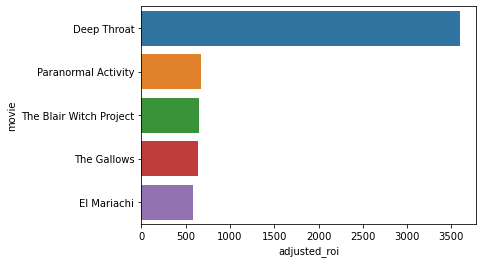

In [52]:
sns.barplot(x ='adjusted_roi', y ='movie', data = movie_budgets_df[:5])

## in breaking news - sex sells

however we should really get rid of that outlier - onlyfans changed the adult entertainment game

In [53]:
movie_budgets_df = movie_budgets_df[movie_budgets_df.movie != "Deep Throat"]

In [54]:
movie_budgets_df.head(1)

,release_date,movie,year,adjusted,adjusted_domestic_gross,adjusted_worldwide_gross,adjusted_production_budget,adjusted_budget_gross_diff,adjusted_roi
id,,,,,,,,,
93,2009-09-25,Paranormal Activity,2009,560903.416694,1.345156e+08,2.420398e+08,560903.416694,3.759946e+08,670.337431


<AxesSubplot:xlabel='adjusted_roi', ylabel='movie'>

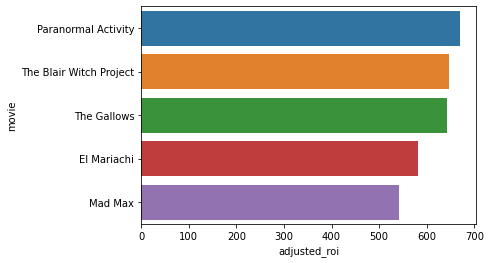

In [55]:
sns.barplot(x ='adjusted_roi', y ='movie', data = movie_budgets_df[:5])

## We will now look at movies with a budget greater than 15M USD

In [56]:
movie_budgets_df = movie_budgets_df[movie_budgets_df["adjusted_production_budget"] >= 15000000]

In [57]:
movie_budgets_df.head()

,release_date,movie,year,adjusted,adjusted_domestic_gross,adjusted_worldwide_gross,adjusted_production_budget,adjusted_budget_gross_diff,adjusted_roi
id,,,,,,,,,
18,1937-12-21,Snow White and the Seven Dwarfs,1937,2.781682e+07,3.457015e+09,3.457015e+09,2.781682e+07,6.886213e+09,247.555761
68,1939-12-15,Gone with the Wind,1939,7.499004e+07,3.820271e+09,7.509102e+09,7.499004e+07,1.125438e+10,150.078375
76,1950-02-15,Cinderella,1950,3.321981e+07,9.736840e+08,3.019468e+09,3.321981e+07,3.959932e+09,119.203936
26,1982-06-11,ET: The Extra-Terrestrial,1982,2.913966e+07,1.207522e+09,2.200642e+09,2.913966e+07,3.379024e+09,115.959608
65,1977-05-25,Star Wars Ep. IV: A New Hope,1977,4.910688e+07,2.058016e+09,3.511580e+09,4.910688e+07,5.520489e+09,112.417819


# Let's bring in the genres!

In [58]:
title_basics_df = csv_files_dict['imdb_title_basics']
title_basics_df.head()

,primary_title,original_title,start_year,runtime_minutes,genres
tconst,,,,,
tt0063540,Sunghursh,Sunghursh,2013,175.0,"Action,Crime,Drama"
tt0066787,One Day Before the Rainy Season,Ashad Ka Ek Din,2019,114.0,"Biography,Drama"
tt0069049,The Other Side of the Wind,The Other Side of the Wind,2018,122.0,Drama
tt0069204,Sabse Bada Sukh,Sabse Bada Sukh,2018,NaN,"Comedy,Drama"
tt0100275,The Wandering Soap Opera,La Telenovela Errante,2017,80.0,"Comedy,Drama,Fantasy"


In [59]:
title_basics_df.shape

(146144, 5)

In [60]:
title_basics_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 146144 entries, tt0063540 to tt9916754
Data columns (total 5 columns):
 #   Column           Non-Null Count   Dtype  
---  ------           --------------   -----  
 0   primary_title    146144 non-null  object 
 1   original_title   146123 non-null  object 
 2   start_year       146144 non-null  int64  
 3   runtime_minutes  114405 non-null  float64
 4   genres           140736 non-null  object 
dtypes: float64(1), int64(1), object(3)
memory usage: 6.7+ MB


In [61]:
title_basics_df.describe()

,start_year,runtime_minutes
count,146144.000000,114405.000000
mean,2014.621798,86.187247
std,2.733583,166.360590
min,2010.000000,1.000000
25%,2012.000000,70.000000
50%,2015.000000,87.000000
75%,2017.000000,99.000000
max,2115.000000,51420.000000


In [62]:
title_basics_df.isna().sum()

primary_title          0
original_title        21
start_year             0
runtime_minutes    31739
genres              5408
dtype: int64

In [63]:
profile2 = ProfileReport(title_basics_df, title ='PPR2', html={'style':{'full_width':True}})

In [64]:
profile2

## Lets inspect the duplicates

In [65]:
title_basics_df.duplicated().sum()

122

In [66]:
title_basics_df.primary_title.duplicated().sum()

10073

In [67]:
title_basics_df.primary_title.duplicated()

tconst
tt0063540    False
tt0066787    False
tt0069049    False
tt0069204    False
tt0100275    False
             ...  
tt9916538    False
tt9916622    False
tt9916706    False
tt9916730    False
tt9916754    False
Name: primary_title, Length: 146144, dtype: bool

In [68]:
title_basics_df[title_basics_df.primary_title.duplicated()]

,primary_title,original_title,start_year,runtime_minutes,genres
tconst,,,,,
tt10022974,Nemesis,Nemesis,2019,NaN,"Action,Thriller"
tt10064536,Untitled Disney Marvel Film,Untitled Disney Marvel Film,2022,NaN,Action
tt10064558,Untitled Marvel Film,Untitled Marvel Film,2021,NaN,Action
tt10127292,Plushtubers: The Apocalypse,Plushtubers: The Apocalypse,2019,NaN,"Action,Adventure"
tt10148772,Indemnity,Indemnity,2018,45.0,Thriller
...,...,...,...,...,...
tt9913594,Bacchanalia,Bacchanalia,2017,72.0,"Drama,Mystery,Thriller"
tt9913936,Paradise,Paradise,2019,NaN,"Crime,Drama"
tt9914642,Albatross,Albatross,2017,NaN,Documentary


In [69]:
title_basics_df[title_basics_df.primary_title.duplicated()].head(50)

,primary_title,original_title,start_year,runtime_minutes,genres
tconst,,,,,
tt10022974,Nemesis,Nemesis,2019,NaN,"Action,Thriller"
tt10064536,Untitled Disney Marvel Film,Untitled Disney Marvel Film,2022,NaN,Action
tt10064558,Untitled Marvel Film,Untitled Marvel Film,2021,NaN,Action
tt10127292,Plushtubers: The Apocalypse,Plushtubers: The Apocalypse,2019,NaN,"Action,Adventure"
tt10148772,Indemnity,Indemnity,2018,45.0,Thriller
tt10155932,Cinderella,Cinderella,2021,NaN,"Comedy,Fantasy"
tt10183816,Windfall,Windfall,2020,NaN,"Horror,Thriller"
tt10217566,Prey,Prey,2019,88.0,Documentary
tt10224422,Olanda,Olanda,2019,154.0,Documentary


### Thats not how to do it

In [70]:
title_basics_df.head()

,primary_title,original_title,start_year,runtime_minutes,genres
tconst,,,,,
tt0063540,Sunghursh,Sunghursh,2013,175.0,"Action,Crime,Drama"
tt0066787,One Day Before the Rainy Season,Ashad Ka Ek Din,2019,114.0,"Biography,Drama"
tt0069049,The Other Side of the Wind,The Other Side of the Wind,2018,122.0,Drama
tt0069204,Sabse Bada Sukh,Sabse Bada Sukh,2018,NaN,"Comedy,Drama"
tt0100275,The Wandering Soap Opera,La Telenovela Errante,2017,80.0,"Comedy,Drama,Fantasy"


In [71]:
title_basics_df[title_basics_df.duplicated()]

,primary_title,original_title,start_year,runtime_minutes,genres
tconst,,,,,
tt10064536,Untitled Disney Marvel Film,Untitled Disney Marvel Film,2022,NaN,Action
tt10064558,Untitled Marvel Film,Untitled Marvel Film,2021,NaN,Action
tt10127292,Plushtubers: The Apocalypse,Plushtubers: The Apocalypse,2019,NaN,"Action,Adventure"
tt10224422,Olanda,Olanda,2019,154.0,Documentary
tt10230042,Rok Sako To Rok Lo,Rok Sako To Rok Lo,2018,NaN,Comedy
...,...,...,...,...,...
tt9616952,View from the Past,View from the Past,2019,NaN,Sci-Fi
tt9660588,3. Elma,3. Elma,2014,65.0,Drama
tt9688944,Um fio de esperança: independência ou guerra n...,Um fio de esperança: independência ou guerra n...,2017,94.0,Documentary


In [72]:
title_basics_df.drop_duplicates(subset=None, keep='first', inplace=True)

In [73]:
title_basics_df.head()

,primary_title,original_title,start_year,runtime_minutes,genres
tconst,,,,,
tt0063540,Sunghursh,Sunghursh,2013,175.0,"Action,Crime,Drama"
tt0066787,One Day Before the Rainy Season,Ashad Ka Ek Din,2019,114.0,"Biography,Drama"
tt0069049,The Other Side of the Wind,The Other Side of the Wind,2018,122.0,Drama
tt0069204,Sabse Bada Sukh,Sabse Bada Sukh,2018,NaN,"Comedy,Drama"
tt0100275,The Wandering Soap Opera,La Telenovela Errante,2017,80.0,"Comedy,Drama,Fantasy"


In [74]:
title_basics_df = title_basics_df.reset_index()

In [75]:
title_basics_df.head()

,tconst,primary_title,original_title,start_year,runtime_minutes,genres
0,tt0063540,Sunghursh,Sunghursh,2013,175.0,"Action,Crime,Drama"
1,tt0066787,One Day Before the Rainy Season,Ashad Ka Ek Din,2019,114.0,"Biography,Drama"
2,tt0069049,The Other Side of the Wind,The Other Side of the Wind,2018,122.0,Drama
3,tt0069204,Sabse Bada Sukh,Sabse Bada Sukh,2018,NaN,"Comedy,Drama"
4,tt0100275,The Wandering Soap Opera,La Telenovela Errante,2017,80.0,"Comedy,Drama,Fantasy"


In [76]:
title_basics_df.drop(columns = ['tconst'], axis =1, inplace=True)
title_basics_df.head()

,primary_title,original_title,start_year,runtime_minutes,genres
0,Sunghursh,Sunghursh,2013,175.0,"Action,Crime,Drama"
1,One Day Before the Rainy Season,Ashad Ka Ek Din,2019,114.0,"Biography,Drama"
2,The Other Side of the Wind,The Other Side of the Wind,2018,122.0,Drama
3,Sabse Bada Sukh,Sabse Bada Sukh,2018,NaN,"Comedy,Drama"
4,The Wandering Soap Opera,La Telenovela Errante,2017,80.0,"Comedy,Drama,Fantasy"


In [77]:
title_basics_df.shape

(146022, 5)

# Lets join budget & genre dfs 

In [78]:
movie_budgets_df.head()

,release_date,movie,year,adjusted,adjusted_domestic_gross,adjusted_worldwide_gross,adjusted_production_budget,adjusted_budget_gross_diff,adjusted_roi
id,,,,,,,,,
18,1937-12-21,Snow White and the Seven Dwarfs,1937,2.781682e+07,3.457015e+09,3.457015e+09,2.781682e+07,6.886213e+09,247.555761
68,1939-12-15,Gone with the Wind,1939,7.499004e+07,3.820271e+09,7.509102e+09,7.499004e+07,1.125438e+10,150.078375
76,1950-02-15,Cinderella,1950,3.321981e+07,9.736840e+08,3.019468e+09,3.321981e+07,3.959932e+09,119.203936
26,1982-06-11,ET: The Extra-Terrestrial,1982,2.913966e+07,1.207522e+09,2.200642e+09,2.913966e+07,3.379024e+09,115.959608
65,1977-05-25,Star Wars Ep. IV: A New Hope,1977,4.910688e+07,2.058016e+09,3.511580e+09,4.910688e+07,5.520489e+09,112.417819


In [79]:
movie_budgets_df = movie_budgets_df.reset_index()

In [80]:
movie_budgets_df.drop(columns = ['id'], axis=1, inplace=True)
movie_budgets_df.head()

,release_date,movie,year,adjusted,adjusted_domestic_gross,adjusted_worldwide_gross,adjusted_production_budget,adjusted_budget_gross_diff,adjusted_roi
0,1937-12-21,Snow White and the Seven Dwarfs,1937,2.781682e+07,3.457015e+09,3.457015e+09,2.781682e+07,6.886213e+09,247.555761
1,1939-12-15,Gone with the Wind,1939,7.499004e+07,3.820271e+09,7.509102e+09,7.499004e+07,1.125438e+10,150.078375
2,1950-02-15,Cinderella,1950,3.321981e+07,9.736840e+08,3.019468e+09,3.321981e+07,3.959932e+09,119.203936
3,1982-06-11,ET: The Extra-Terrestrial,1982,2.913966e+07,1.207522e+09,2.200642e+09,2.913966e+07,3.379024e+09,115.959608
4,1977-05-25,Star Wars Ep. IV: A New Hope,1977,4.910688e+07,2.058016e+09,3.511580e+09,4.910688e+07,5.520489e+09,112.417819


In [81]:
movie_details_df = pd.merge(movie_budgets_df, title_basics_df, left_on=  ['movie'],
                   right_on= ['primary_title'], 
                   how = 'left')


In [82]:
movie_details_df.shape

(4343, 14)

In [83]:
movie_details_df.head(50)

,release_date,movie,year,adjusted,adjusted_domestic_gross,adjusted_worldwide_gross,adjusted_production_budget,adjusted_budget_gross_diff,adjusted_roi,primary_title,original_title,start_year,runtime_minutes,genres
0,1937-12-21,Snow White and the Seven Dwarfs,1937,2.781682e+07,3.457015e+09,3.457015e+09,2.781682e+07,6.886213e+09,247.555761,Snow White and the Seven Dwarfs,Snow White and the Seven Dwarfs,2017.0,49.0,"Animation,Family"
1,1937-12-21,Snow White and the Seven Dwarfs,1937,2.781682e+07,3.457015e+09,3.457015e+09,2.781682e+07,6.886213e+09,247.555761,Snow White and the Seven Dwarfs,Snow White and the Seven Dwarfs,2016.0,NaN,"Comedy,Drama,Fantasy"
2,1939-12-15,Gone with the Wind,1939,7.499004e+07,3.820271e+09,7.509102e+09,7.499004e+07,1.125438e+10,150.078375,NaN,NaN,NaN,NaN,NaN
3,1950-02-15,Cinderella,1950,3.321981e+07,9.736840e+08,3.019468e+09,3.321981e+07,3.959932e+09,119.203936,Cinderella,Cinderella,2018.0,150.0,Musical
4,1950-02-15,Cinderella,1950,3.321981e+07,9.736840e+08,3.019468e+09,3.321981e+07,3.959932e+09,119.203936,Cinderella,Cinderella,2021.0,NaN,"Comedy,Fantasy"
5,1950-02-15,Cinderella,1950,3.321981e+07,9.736840e+08,3.019468e+09,3.321981e+07,3.959932e+09,119.203936,Cinderella,Cinderella,2015.0,105.0,"Drama,Family,Fantasy"
6,1950-02-15,Cinderella,1950,3.321981e+07,9.736840e+08,3.019468e+09,3.321981e+07,3.959932e+09,119.203936,Cinderella,Cinderella,2013.0,120.0,Music
7,1950-02-15,Cinderella,1950,3.321981e+07,9.736840e+08,3.019468e+09,3.321981e+07,3.959932e+09,119.203936,Cinderella,Cinderella,2015.0,113.0,Fantasy
8,1950-02-15,Cinderella,1950,3.321981e+07,9.736840e+08,3.019468e+09,3.321981e+07,3.959932e+09,119.203936,Cinderella,Cinderella,2016.0,130.0,Musical
9,1950-02-15,Cinderella,1950,3.321981e+07,9.736840e+08,3.019468e+09,3.321981e+07,3.959932e+09,119.203936,Cinderella,Cinderella,2018.0,NaN,Drama


In [84]:
movie_details_df.dropna(subset= ['genres'], inplace=True)

In [85]:
movie_details_df.movie.duplicated().sum()

782

In [86]:
movie_details_df.shape

(2119, 14)

In [87]:
movie_details_df.drop_duplicates(subset='movie', keep=False, inplace=True)

In [88]:
movie_details_df.head(25)

,release_date,movie,year,adjusted,adjusted_domestic_gross,adjusted_worldwide_gross,adjusted_production_budget,adjusted_budget_gross_diff,adjusted_roi,primary_title,original_title,start_year,runtime_minutes,genres
18,1940-11-13,Fantasia,1940,4.384033e+07,1.602095e+09,1.602095e+09,4.384033e+07,3.160349e+09,72.087719,Fantasia,Fantasia,2014.0,86.0,Drama
47,2010-12-03,Black Swan,2010,1.596656e+07,1.313614e+08,4.068608e+08,1.596656e+07,5.222557e+08,32.709338,Black Swan,Black Swan,2010.0,108.0,"Drama,Thriller"
58,2017-09-08,It,2017,3.817301e+07,3.571704e+08,7.606878e+08,3.817301e+07,1.079685e+09,28.283992,It,It,2017.0,135.0,"Horror,Thriller"
59,2016-12-09,La La Land,2016,2.229986e+07,1.684775e+08,4.753786e+08,2.229986e+07,6.215562e+08,27.872648,La La Land,La La Land,2016.0,128.0,"Comedy,Drama,Music"
60,1989-12-13,Driving Miss Daisy,1989,1.601080e+07,2.275526e+08,2.275526e+08,1.601080e+07,4.390944e+08,27.424879,Driving Miss Daisy,Driving Miss Daisy,2014.0,100.0,"Comedy,Drama"
61,1973-06-27,Live and Let Die,1973,4.263269e+07,2.155996e+08,9.854242e+08,4.263269e+07,1.158391e+09,27.171429,Live and Let Die,Live and Let Die,2015.0,45.0,"Drama,War"
63,2017-08-11,Annabelle: Creation,2017,1.644649e+07,1.119372e+08,3.348339e+08,1.644649e+07,4.303246e+08,26.165138,Annabelle: Creation,Annabelle: Creation,2017.0,109.0,"Horror,Mystery,Thriller"
93,2013-07-19,The Conjuring,2013,2.304791e+07,1.583393e+08,3.664620e+08,2.304791e+07,5.017534e+08,21.770014,The Conjuring,The Conjuring,2013.0,112.0,"Horror,Mystery,Thriller"
96,1946-11-21,The Best Years of Our Lives,1946,2.654035e+07,2.982630e+08,2.982630e+08,2.654035e+07,5.699857e+08,21.476190,The Best Years of Our Lives,The Best Years of Our Lives,2013.0,NaN,Comedy
101,1988-12-09,Twins,1988,3.350975e+07,2.500640e+08,4.838808e+08,3.350975e+07,7.004351e+08,20.902426,Twins,Twins,2016.0,8.0,"Adventure,Biography,Comedy"


In [89]:
movie_details_df.shape

(995, 14)

### Now we will analyze the frequency of the genres 

In [90]:
type(movie_details_df.genres)

pandas.core.series.Series

In [91]:
movie_details_df.genres = movie_details_df.genres.apply(lambda x: x.split(',') if x else x)

In [92]:
movie_details_df.head()

,release_date,movie,year,adjusted,adjusted_domestic_gross,adjusted_worldwide_gross,adjusted_production_budget,adjusted_budget_gross_diff,adjusted_roi,primary_title,original_title,start_year,runtime_minutes,genres
18,1940-11-13,Fantasia,1940,4.384033e+07,1.602095e+09,1.602095e+09,4.384033e+07,3.160349e+09,72.087719,Fantasia,Fantasia,2014.0,86.0,[Drama]
47,2010-12-03,Black Swan,2010,1.596656e+07,1.313614e+08,4.068608e+08,1.596656e+07,5.222557e+08,32.709338,Black Swan,Black Swan,2010.0,108.0,"[Drama, Thriller]"
58,2017-09-08,It,2017,3.817301e+07,3.571704e+08,7.606878e+08,3.817301e+07,1.079685e+09,28.283992,It,It,2017.0,135.0,"[Horror, Thriller]"
59,2016-12-09,La La Land,2016,2.229986e+07,1.684775e+08,4.753786e+08,2.229986e+07,6.215562e+08,27.872648,La La Land,La La Land,2016.0,128.0,"[Comedy, Drama, Music]"
60,1989-12-13,Driving Miss Daisy,1989,1.601080e+07,2.275526e+08,2.275526e+08,1.601080e+07,4.390944e+08,27.424879,Driving Miss Daisy,Driving Miss Daisy,2014.0,100.0,"[Comedy, Drama]"


In [93]:
movie_details_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 995 entries, 18 to 4335
Data columns (total 14 columns):
 #   Column                      Non-Null Count  Dtype         
---  ------                      --------------  -----         
 0   release_date                995 non-null    datetime64[ns]
 1   movie                       995 non-null    object        
 2   year                        995 non-null    int64         
 3   adjusted                    995 non-null    float64       
 4   adjusted_domestic_gross     995 non-null    float64       
 5   adjusted_worldwide_gross    995 non-null    float64       
 6   adjusted_production_budget  995 non-null    float64       
 7   adjusted_budget_gross_diff  995 non-null    float64       
 8   adjusted_roi                995 non-null    float64       
 9   primary_title               995 non-null    object        
 10  original_title              995 non-null    object        
 11  start_year                  995 non-null    float64     

In [94]:
all_genres = set()
for genres in movie_details_df['genres']:
    if genres:
        all_genres.update(genres)

In [95]:
all_genres

{'Action',
 'Adventure',
 'Animation',
 'Biography',
 'Comedy',
 'Crime',
 'Documentary',
 'Drama',
 'Family',
 'Fantasy',
 'History',
 'Horror',
 'Music',
 'Musical',
 'Mystery',
 'News',
 'Romance',
 'Sci-Fi',
 'Sport',
 'Thriller',
 'War',
 'Western'}

<AxesSubplot:xlabel='adjusted_production_budget', ylabel='adjusted_roi'>

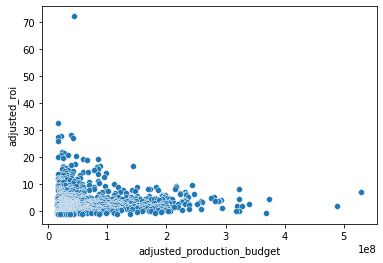

In [96]:
sns.scatterplot(x='adjusted_production_budget', y= 'adjusted_roi', data= movie_details_df)

In [97]:
movie_details_df['genrestr'] = movie_details_df.genres.apply(lambda x: ''.join(str(x)))

In [98]:
movie_details_df.head(1)

,release_date,movie,year,adjusted,adjusted_domestic_gross,adjusted_worldwide_gross,adjusted_production_budget,adjusted_budget_gross_diff,adjusted_roi,primary_title,original_title,start_year,runtime_minutes,genres,genrestr
18,1940-11-13,Fantasia,1940,4.384033e+07,1.602095e+09,1.602095e+09,4.384033e+07,3.160349e+09,72.087719,Fantasia,Fantasia,2014.0,86.0,[Drama],['Drama']


In [99]:
for genre in all_genres:
    movie_details_df[genre] = np.zeros(shape=movie_details_df.shape[0])
                                
movie_details_df.head()

,release_date,movie,year,adjusted,adjusted_domestic_gross,adjusted_worldwide_gross,adjusted_production_budget,adjusted_budget_gross_diff,adjusted_roi,primary_title,...,Comedy,Thriller,Drama,Musical,Family,Animation,Sport,Crime,Action,History
18,1940-11-13,Fantasia,1940,4.384033e+07,1.602095e+09,1.602095e+09,4.384033e+07,3.160349e+09,72.087719,Fantasia,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
47,2010-12-03,Black Swan,2010,1.596656e+07,1.313614e+08,4.068608e+08,1.596656e+07,5.222557e+08,32.709338,Black Swan,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
58,2017-09-08,It,2017,3.817301e+07,3.571704e+08,7.606878e+08,3.817301e+07,1.079685e+09,28.283992,It,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
59,2016-12-09,La La Land,2016,2.229986e+07,1.684775e+08,4.753786e+08,2.229986e+07,6.215562e+08,27.872648,La La Land,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
60,1989-12-13,Driving Miss Daisy,1989,1.601080e+07,2.275526e+08,2.275526e+08,1.601080e+07,4.390944e+08,27.424879,Driving Miss Daisy,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [100]:
#setting the genre to be 1 if the film is of that genre

for index, row in movie_details_df.iterrows():
    if row['genres']:
        for genre in row['genres']:
            movie_details_df.loc[index, genre] = 1

movie_details_df.head()


,release_date,movie,year,adjusted,adjusted_domestic_gross,adjusted_worldwide_gross,adjusted_production_budget,adjusted_budget_gross_diff,adjusted_roi,primary_title,...,Comedy,Thriller,Drama,Musical,Family,Animation,Sport,Crime,Action,History
18,1940-11-13,Fantasia,1940,4.384033e+07,1.602095e+09,1.602095e+09,4.384033e+07,3.160349e+09,72.087719,Fantasia,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
47,2010-12-03,Black Swan,2010,1.596656e+07,1.313614e+08,4.068608e+08,1.596656e+07,5.222557e+08,32.709338,Black Swan,...,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
58,2017-09-08,It,2017,3.817301e+07,3.571704e+08,7.606878e+08,3.817301e+07,1.079685e+09,28.283992,It,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
59,2016-12-09,La La Land,2016,2.229986e+07,1.684775e+08,4.753786e+08,2.229986e+07,6.215562e+08,27.872648,La La Land,...,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
60,1989-12-13,Driving Miss Daisy,1989,1.601080e+07,2.275526e+08,2.275526e+08,1.601080e+07,4.390944e+08,27.424879,Driving Miss Daisy,...,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [101]:
movie_details_df.drop(columns = 'genres', inplace= True)

In [102]:
movie_details_df.drop(columns = 'genrestr', inplace= True)

In [103]:
cols = list(movie_details_df.columns)

In [104]:
genre_cols = cols[13:]

In [105]:
#getting a dict with genre counts

genre_count = {}
for col in genre_cols:
    count = np.sum(movie_details_df[col] == 1).sum() 
    genre_count[col] = count

In [106]:
genre_count

{'War': 17,
 'Mystery': 52,
 'Fantasy': 88,
 'Western': 8,
 'News': 1,
 'Documentary': 52,
 'Adventure': 297,
 'Sci-Fi': 94,
 'Horror': 71,
 'Romance': 99,
 'Music': 29,
 'Biography': 88,
 'Comedy': 341,
 'Thriller': 144,
 'Drama': 417,
 'Musical': 4,
 'Family': 70,
 'Animation': 94,
 'Sport': 21,
 'Crime': 147,
 'Action': 347,
 'History': 29}

In [107]:
genre_count_ascending = dict( sorted(genre_count.items(),
                           key=lambda item: item[1], reverse = True))
print(genre_count_ascending)

{'Drama': 417, 'Action': 347, 'Comedy': 341, 'Adventure': 297, 'Crime': 147, 'Thriller': 144, 'Romance': 99, 'Sci-Fi': 94, 'Animation': 94, 'Fantasy': 88, 'Biography': 88, 'Horror': 71, 'Family': 70, 'Mystery': 52, 'Documentary': 52, 'Music': 29, 'History': 29, 'Sport': 21, 'War': 17, 'Western': 8, 'Musical': 4, 'News': 1}


In [108]:
keys = list(genre_count_ascending.keys())
values = list(genre_count_ascending.values())

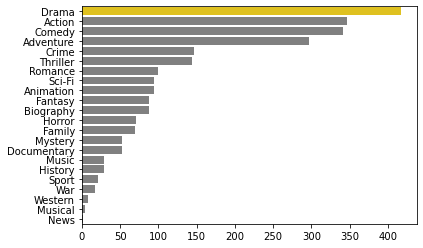

In [109]:
clrs = ['grey' if (x < max(values)) else "gold" for x in values ]
sns.barplot(y = keys, x = values, palette=clrs);

In [110]:
movie_details_df.head()

,release_date,movie,year,adjusted,adjusted_domestic_gross,adjusted_worldwide_gross,adjusted_production_budget,adjusted_budget_gross_diff,adjusted_roi,primary_title,...,Comedy,Thriller,Drama,Musical,Family,Animation,Sport,Crime,Action,History
18,1940-11-13,Fantasia,1940,4.384033e+07,1.602095e+09,1.602095e+09,4.384033e+07,3.160349e+09,72.087719,Fantasia,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
47,2010-12-03,Black Swan,2010,1.596656e+07,1.313614e+08,4.068608e+08,1.596656e+07,5.222557e+08,32.709338,Black Swan,...,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
58,2017-09-08,It,2017,3.817301e+07,3.571704e+08,7.606878e+08,3.817301e+07,1.079685e+09,28.283992,It,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
59,2016-12-09,La La Land,2016,2.229986e+07,1.684775e+08,4.753786e+08,2.229986e+07,6.215562e+08,27.872648,La La Land,...,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
60,1989-12-13,Driving Miss Daisy,1989,1.601080e+07,2.275526e+08,2.275526e+08,1.601080e+07,4.390944e+08,27.424879,Driving Miss Daisy,...,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [111]:
movie_details_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 995 entries, 18 to 4335
Data columns (total 35 columns):
 #   Column                      Non-Null Count  Dtype         
---  ------                      --------------  -----         
 0   release_date                995 non-null    datetime64[ns]
 1   movie                       995 non-null    object        
 2   year                        995 non-null    int64         
 3   adjusted                    995 non-null    float64       
 4   adjusted_domestic_gross     995 non-null    float64       
 5   adjusted_worldwide_gross    995 non-null    float64       
 6   adjusted_production_budget  995 non-null    float64       
 7   adjusted_budget_gross_diff  995 non-null    float64       
 8   adjusted_roi                995 non-null    float64       
 9   primary_title               995 non-null    object        
 10  original_title              995 non-null    object        
 11  start_year                  995 non-null    float64     

In [112]:
movie_details_df.drop(columns=['primary_title', 'original_title', 'start_year'], inplace=True)

In [113]:
movie_details_df.reset_index(inplace=True)

In [114]:
movie_details_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 995 entries, 0 to 994
Data columns (total 33 columns):
 #   Column                      Non-Null Count  Dtype         
---  ------                      --------------  -----         
 0   index                       995 non-null    int64         
 1   release_date                995 non-null    datetime64[ns]
 2   movie                       995 non-null    object        
 3   year                        995 non-null    int64         
 4   adjusted                    995 non-null    float64       
 5   adjusted_domestic_gross     995 non-null    float64       
 6   adjusted_worldwide_gross    995 non-null    float64       
 7   adjusted_production_budget  995 non-null    float64       
 8   adjusted_budget_gross_diff  995 non-null    float64       
 9   adjusted_roi                995 non-null    float64       
 10  runtime_minutes             938 non-null    float64       
 11  War                         995 non-null    float64       

In [115]:
movie_details_df.drop(columns=['adjusted', 'runtime_minutes', 'index'], inplace=True)

In [116]:
movie_details_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 995 entries, 0 to 994
Data columns (total 30 columns):
 #   Column                      Non-Null Count  Dtype         
---  ------                      --------------  -----         
 0   release_date                995 non-null    datetime64[ns]
 1   movie                       995 non-null    object        
 2   year                        995 non-null    int64         
 3   adjusted_domestic_gross     995 non-null    float64       
 4   adjusted_worldwide_gross    995 non-null    float64       
 5   adjusted_production_budget  995 non-null    float64       
 6   adjusted_budget_gross_diff  995 non-null    float64       
 7   adjusted_roi                995 non-null    float64       
 8   War                         995 non-null    float64       
 9   Mystery                     995 non-null    float64       
 10  Fantasy                     995 non-null    float64       
 11  Western                     995 non-null    float64       

In [117]:
roi_mean = {}
for genre in all_genres:
    grouped2 = movie_details_df.groupby(by = "".join(genre)).mean()
    roi_mean[genre] = grouped2.iloc[1]["adjusted_roi"]

In [118]:
roi_mean = dict( sorted(roi_mean.items(),
                           key=lambda item: item[1], reverse = True))


In [119]:
roi_mean

{'Musical': 6.78556474964986,
 'Music': 5.798064524279124,
 'Animation': 4.359978935675441,
 'War': 4.142639392081059,
 'Documentary': 3.9679658982269554,
 'Comedy': 3.90624661787438,
 'Biography': 3.8817862303294675,
 'Horror': 3.8119696528446236,
 'Mystery': 3.7493281259331495,
 'Romance': 3.7320036989662584,
 'Drama': 3.6254239102430996,
 'Thriller': 3.614109084428389,
 'Adventure': 3.5155044158076834,
 'News': 3.4550963333333327,
 'Sci-Fi': 3.4444670665705113,
 'Family': 3.3224583763431106,
 'Action': 2.8766583409917663,
 'History': 2.849698664317799,
 'Fantasy': 2.5742772265516276,
 'Crime': 2.5124348375969046,
 'Western': 2.478174095376984,
 'Sport': 1.6293173478157432}

In [120]:
production_buget_mean = {}
for genre in all_genres:
    grouped3 = movie_details_df.groupby(by = "".join(genre)).mean()
    production_buget_mean[genre] = grouped3.iloc[1]["adjusted_production_budget"]

In [121]:
production_buget_mean

{'War': 49394659.24521169,
 'Mystery': 59223537.67542675,
 'Fantasy': 118225069.63194667,
 'Western': 88614208.6918768,
 'News': 22262853.204686426,
 'Documentary': 54118696.65635443,
 'Adventure': 131299825.78626546,
 'Sci-Fi': 137161944.3289177,
 'Horror': 57874765.07839356,
 'Romance': 41791717.12001092,
 'Music': 30933984.76103356,
 'Biography': 38351011.16027257,
 'Comedy': 64782411.92477908,
 'Thriller': 62926335.75469669,
 'Drama': 51136557.265586086,
 'Musical': 93706883.44889015,
 'Family': 91386345.2603568,
 'Animation': 114232887.8106643,
 'Sport': 38473529.448861435,
 'Crime': 48647634.98771405,
 'Action': 105972673.59536305,
 'History': 45513877.376168445}

In [122]:
production_buget_mean = dict( sorted(production_buget_mean.items(),
                           key=lambda item: item[1], reverse = True))
print(production_buget_mean)

{'Sci-Fi': 137161944.3289177, 'Adventure': 131299825.78626546, 'Fantasy': 118225069.63194667, 'Animation': 114232887.8106643, 'Action': 105972673.59536305, 'Musical': 93706883.44889015, 'Family': 91386345.2603568, 'Western': 88614208.6918768, 'Comedy': 64782411.92477908, 'Thriller': 62926335.75469669, 'Mystery': 59223537.67542675, 'Horror': 57874765.07839356, 'Documentary': 54118696.65635443, 'Drama': 51136557.265586086, 'War': 49394659.24521169, 'Crime': 48647634.98771405, 'History': 45513877.376168445, 'Romance': 41791717.12001092, 'Sport': 38473529.448861435, 'Biography': 38351011.16027257, 'Music': 30933984.76103356, 'News': 22262853.204686426}


In [123]:
production_buget_mean

{'Sci-Fi': 137161944.3289177,
 'Adventure': 131299825.78626546,
 'Fantasy': 118225069.63194667,
 'Animation': 114232887.8106643,
 'Action': 105972673.59536305,
 'Musical': 93706883.44889015,
 'Family': 91386345.2603568,
 'Western': 88614208.6918768,
 'Comedy': 64782411.92477908,
 'Thriller': 62926335.75469669,
 'Mystery': 59223537.67542675,
 'Horror': 57874765.07839356,
 'Documentary': 54118696.65635443,
 'Drama': 51136557.265586086,
 'War': 49394659.24521169,
 'Crime': 48647634.98771405,
 'History': 45513877.376168445,
 'Romance': 41791717.12001092,
 'Sport': 38473529.448861435,
 'Biography': 38351011.16027257,
 'Music': 30933984.76103356,
 'News': 22262853.204686426}

In [124]:
horror_df = movie_details_df.groupby('Horror').filter(lambda x: any(x['Horror'] == 1))
horror_df

,release_date,movie,year,adjusted_domestic_gross,adjusted_worldwide_gross,adjusted_production_budget,adjusted_budget_gross_diff,adjusted_roi,War,Mystery,...,Comedy,Thriller,Drama,Musical,Family,Animation,Sport,Crime,Action,History
2,2017-09-08,It,2017,3.571704e+08,7.606878e+08,3.817301e+07,1.079685e+09,28.283992,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6,2017-08-11,Annabelle: Creation,2017,1.119372e+08,3.348339e+08,1.644649e+07,4.303246e+08,26.165138,0.0,1.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7,2013-07-19,The Conjuring,2013,1.583393e+08,3.664620e+08,2.304791e+07,5.017534e+08,21.770014,0.0,1.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
59,2012-02-03,The Woman in Black,2012,6.424518e+07,1.524810e+08,1.773641e+07,1.989898e+08,11.219279,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
66,2000-05-19,Road Trip,2000,1.075612e+08,1.879485e+08,2.511440e+07,2.703953e+08,10.766545,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
932,2018-10-26,Suspiria,2018,2.643645e+06,7.488318e+06,2.128991e+07,-1.115795e+07,-0.524096,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
941,2016-09-09,The Disappointments Room,2016,2.702194e+06,3.906734e+06,1.672517e+07,-1.011625e+07,-0.604851,0.0,0.0,...,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
948,1999-03-19,Ravenous,1999,3.364784e+06,3.364784e+06,1.957782e+07,-1.284825e+07,-0.656266,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
952,2010-06-18,The Killer Inside Me,2010,2.683453e+05,4.467474e+06,1.605549e+07,-1.131967e+07,-0.705034,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0


In [125]:
upper_limit = horror_df.adjusted_roi.mean() + 3*horror_df.adjusted_roi.std()

In [126]:
lower_limit = horror_df.adjusted_roi.mean() - 3*horror_df.adjusted_roi.std()

In [127]:
horror_df[(horror_df.adjusted_roi> upper_limit) | (horror_df.adjusted_roi<lower_limit)]

,release_date,movie,year,adjusted_domestic_gross,adjusted_worldwide_gross,adjusted_production_budget,adjusted_budget_gross_diff,adjusted_roi,War,Mystery,...,Comedy,Thriller,Drama,Musical,Family,Animation,Sport,Crime,Action,History
2,2017-09-08,It,2017,3.571704e+08,7.606878e+08,3.817301e+07,1.079685e+09,28.283992,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6,2017-08-11,Annabelle: Creation,2017,1.119372e+08,3.348339e+08,1.644649e+07,4.303246e+08,26.165138,0.0,1.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7,2013-07-19,The Conjuring,2013,1.583393e+08,3.664620e+08,2.304791e+07,5.017534e+08,21.770014,0.0,1.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [128]:
profile3 = ProfileReport(horror_df, title ='Horror_Profile', html={'style':{'full_width':True}})

In [129]:
profile3

<AxesSubplot:>

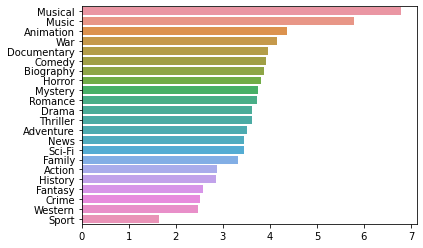

In [130]:
sns.barplot(x = list(roi_mean.values()), y= list(roi_mean.keys()))

In [131]:
movie_details_df.drop([0], inplace=True)

In [132]:
roi_mean = {}
for genre in all_genres:
    grouped2 = movie_details_df.groupby(by = "".join(genre)).mean()
    roi_mean[genre] = grouped2.iloc[1]["adjusted_roi"]

In [133]:
roi_mean = dict( sorted(roi_mean.items(),
                           key=lambda item: item[1], reverse = True))


In [134]:
roi_mean

{'Musical': 6.78556474964986,
 'Music': 5.798064524279124,
 'Animation': 4.359978935675441,
 'War': 4.142639392081059,
 'Documentary': 3.9679658982269554,
 'Comedy': 3.90624661787438,
 'Biography': 3.8817862303294675,
 'Horror': 3.8119696528446236,
 'Mystery': 3.7493281259331495,
 'Romance': 3.7320036989662584,
 'Thriller': 3.614109084428389,
 'Adventure': 3.5155044158076834,
 'Drama': 3.460851084791171,
 'News': 3.4550963333333327,
 'Sci-Fi': 3.4444670665705113,
 'Family': 3.3224583763431106,
 'Action': 2.8766583409917663,
 'History': 2.849698664317799,
 'Fantasy': 2.5742772265516276,
 'Crime': 2.5124348375969046,
 'Western': 2.478174095376984,
 'Sport': 1.6293173478157432}

<AxesSubplot:>

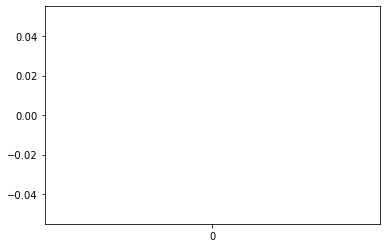

In [135]:
sns.barplot()b

In [136]:
test UwU


SyntaxError: invalid syntax (<ipython-input-136-ffce77cea93f>, line 1)